In [1]:
import cv2
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.externals import joblib
from operator import itemgetter
from time import time
import matplotlib.pyplot as plt
import glob
import pickle
import tabulate

from moviepy.editor import VideoFileClip
from IPython.display import HTML

import sklearn
%matplotlib inline

# Utils

In [2]:
def draw_boxes(img, bboxes, color = [0, 0, 255], thickness = 6):
    cl = color
    for (tl, br) in bboxes:
        if color == None:
            cl = (np.random.randint(0, 256), np.random.randint(0, 256), np.random.randint(0, 256))
        cv2.rectangle(img, tl, br, cl, thickness)

# Load Data

12


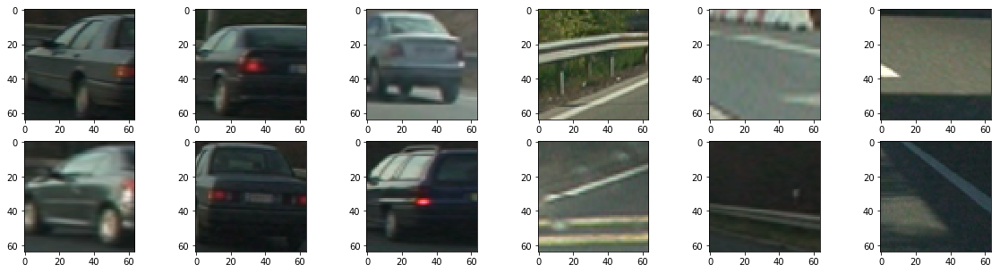

In [78]:
images = glob.glob('data/vehicles/**/*')[:6] + glob.glob('data/non-vehicles/**/*')[:6]
grid = (2, 6)
coors = np.vstack(np.mgrid[:grid[0], :grid[1]].T)
data = []
f = plt.figure(figsize = (20, 5))
for idx, iname in enumerate(images):
    img = cv2.imread(iname)
    axis = plt.subplot2grid(grid, coors[idx])
    img = img[:, :, ::-1]
    axis.imshow(img)
    data.append(img)

f.savefig('output_images/car_not_car')
print(len(data))

# Feature Extraction

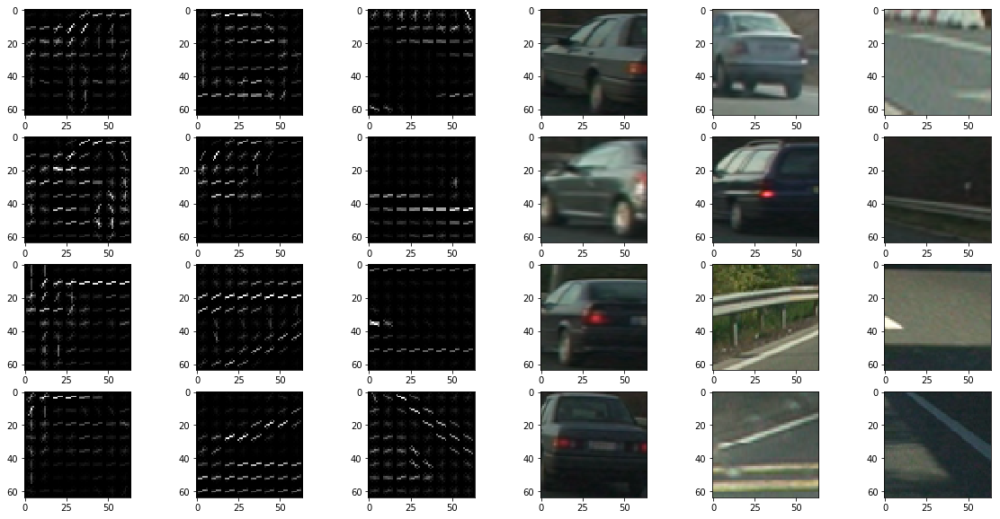

In [79]:
from skimage.feature import hog

orient = 9
pix_per_cell = 8
cell_per_block = 2

def extract_hog_features(img, cspace = None, orient = orient, pix_per_cell = pix_per_cell, 
                     cell_per_block = cell_per_block, feature_vec = True, debug = False):
    hog_image = None
    img = np.copy(img)
    if cspace != None:
        img = cv2.cvtColor(img, cspace)
    
    features = []
    visual = []
    for channel in range(img.shape[-1]):
        if debug:
            hog_features, hog_image = hog(
                img[:, :, channel], 
                orientations = orient, 
                pixels_per_cell = (pix_per_cell, pix_per_cell), 
                cells_per_block = (cell_per_block, cell_per_block),
                visualise = True,
                feature_vector = feature_vec,
                transform_sqrt = False,
                block_norm = 'L2-Hys'
            )
        else:
            hog_features = hog(
                img[:, :, channel], 
                orientations = orient, 
                pixels_per_cell = (pix_per_cell, pix_per_cell), 
                cells_per_block = (cell_per_block, cell_per_block),
                visualise = False,
                feature_vector = feature_vec,
                transform_sqrt = False,
                block_norm = 'L2-Hys'
            )
        features.append(hog_features)
        visual.append(hog_image)

    if feature_vec:
        return np.ravel(features), np.dstack(visual)
    else:
        return features, np.dstack(visual)
    
def extract_color_features(img, size = (32, 32)):
    features = []
    for channel in range(img.shape[-1]):
        ch_feature = cv2.resize(img[:, :, channel], size).ravel()
        features.append(ch_feature)
    return np.array(features)

def extract_hist_features(img, nbins = 32, ranges = (0, 256)):
    features = []
    for channel in range(img.shape[-1]):
        features.append(cv2.calcHist(img, [channel], None, (nbins, ), ranges))
    return np.array(features)

def extract_features(img, cspace = None, orient = orient, pix_per_cell = pix_per_cell, 
                     cell_per_block = cell_per_block, spatial_bin = (32, 32), nbins = 32, ranges = (0, 256)):
    color_features = extract_color_features(img, spatial_bin).ravel()
    hist_features = extract_hist_features(img, nbins, ranges).ravel()
    hog_features, _ = extract_hog_features(img, cspace, orient, pix_per_cell, cell_per_block)

    return np.concatenate((color_features, hist_features, hog_features))

f = plt.figure(figsize = (20, 10))
grid = (4, 6)
coors = np.vstack(np.mgrid[:grid[0], :grid[1]].T)
for idx, img in enumerate(data):
    features, output = extract_hog_features(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).reshape(*img.shape[:2], 1)
                                        , debug = True)
    ax = plt.subplot2grid(grid, coors[idx])
    ax.imshow(output.squeeze(), cmap = 'gray')
    ax = plt.subplot2grid(grid, coors[idx + (grid[1] * grid[0] // 2)])
    ax.imshow(img)
    
f.savefig('output_images/HOG_example')

# Augment and Split data

In [5]:
car_files = glob.glob('data/vehicles/**/*')
noncar_files = glob.glob('data/non-vehicles/**/*')

# Experiment with histogram comparison
car_labels = []
cars = []
car_cls = 1
prev_hist = None
# Deal with time-series data in GTI by using histogram comparison
for idx, iname in enumerate(car_files):
    img = cv2.imread(iname)
    hist = extract_hist_features(img).ravel()
    if idx != 0:
        score = cv2.compareHist(prev_hist, hist, cv2.HISTCMP_CORREL)
        if score < 0.5:
            car_cls += 1
    prev_hist = hist
    car_labels.append(car_cls)
    cars.append(iname)
    
noncars = []
for idx, iname in enumerate(noncar_files):
    noncars.append(iname)

# Split using car labels to ensure class distributions
# sss = StratifiedShuffleSplit(n_splits = 1, test_size = 0.35, random_state = SEED)

# X, y = np.concatenate([cars, noncars]), np.concatenate([car_labels, noncar_labels])
# # Make sure we have correct distribution
# for train_index, test_index in sss.split(X, y):
#     train_y = y[train_index]
#     test_y = y[test_index]

# f, (ax1, ax2) = plt.subplots(1, 2, figsize = (8, 4))

# # plot test, train class distributions in log scale
# hist, edges = np.histogram(train_y)
# centers = np.round(np.log((edges[1:] - edges[0:-1]) / 2.0 + edges[1:]), 1)
# inds = np.arange(len(centers)) * 4
# ax1.bar(inds, np.log(hist), width = 2)
# ax1.xaxis.set_ticklabels(centers)
# ax1.xaxis.set_ticks(inds)

# hist, edges = np.histogram(test_y)
# centers = np.round(np.log((edges[1:] - edges[0:-1]) / 2.0 + edges[1:]), 1)
# inds = np.arange(len(centers)) * 4
# ax2.bar(inds, np.log(hist), width = 2)
# ax2.xaxis.set_ticklabels(centers)
# ax2.xaxis.set_ticks(inds)

print(len(cars), len(noncars))

8792 8968


# Parameter Exploration

In [6]:
def flag_odd_index(x):
    return zip(x, [bool(i & 1) for i in range(len(x))])

def read_images(x):
    return [cv2.imread(iname) for iname in x]

def serialize_model(model, cspace, orient, pix_per_cell, cell_per_block):
    joblib.dump(model, 'model_{}_{}_{}_{}.pkl'.format(orient, pix_per_cell, cell_per_block, cspace))
    
def deserialize_model(cspace, orient, pix_per_cell, cell_per_block):
    return joblib.load('model_{}_{}_{}_{}.pkl'.format(orient, pix_per_cell, cell_per_block, cspace))
    
def stream_converted_images(cars, noncars, color_cvt):
    if color_cvt == None:
        for car in cars:
            yield car.astype(np.float32)
        for noncar in noncars:
            yield noncar.astype(np.float32)
    else:
        for car in cars:
            yield cv2.cvtColor(car, color_cvt).astype(np.float32)
        for noncar in noncars:
            yield cv2.cvtColor(noncar, color_cvt).astype(np.float32)

Here we see that orient = 12, Pix/ Cell = 8, Color space = YCrCb, cell / block = 2 is the best performing parameters.

|   Orient |   Pix p/ Cell | Color   |   Time Train |   Accuracy |   Time Predict |   Time Extract |
|---------:|--------------:|:--------|-------------:|-----------:|---------------:|---------------:|
|        9 |            16 | RGB     |        42.6  |   0.967142 |       0.012137 |        130.713 |
|        9 |            16 | BGR     |        41.85 |   0.967243 |       0.020589 |        131.302 |
|       11 |            16 | YUV     |        33.37 |   0.983722 |       0.01314  |        131.399 |
|       11 |            16 | BGR     |        43.06 |   0.969051 |       0.012509 |        131.425 |
|        9 |            16 | YCrCb   |        33.06 |   0.981712 |       0.025503 |        133.672 |
|       12 |            16 | BGR     |        42.28 |   0.970659 |       0.019639 |        134.156 |
|       12 |            16 | YUV     |        33.45 |   0.984727 |       0.009258 |        134.423 |
|       11 |            16 | YCrCb   |        34.61 |   0.982918 |       0.014757 |        134.845 |
|        9 |            16 | YUV     |        33.06 |   0.982818 |       0.020851 |        135.855 |
|       11 |            16 | RGB     |        46.11 |   0.96875  |       0.006432 |        139.287 |
|       12 |            16 | YCrCb   |        35.08 |   0.987239 |       0.019432 |        140.27  |
|       11 |            16 | HSV     |        42.62 |   0.97297  |       0.007138 |        142.71  |
|       12 |            16 | RGB     |        54.55 |   0.970559 |       0.033296 |        145.178 |
|        9 |            16 | HSV     |        52.98 |   0.971764 |       0.008253 |        179.634 |
|       11 |            16 | HLS     |        56    |   0.968147 |       0.012969 |        180.886 |
|        9 |            16 | HLS     |        54.6  |   0.966941 |       0.011595 |        181.395 |
|       12 |            16 | HLS     |        55.85 |   0.973774 |       0.019097 |        185.866 |
|       12 |            16 | HSV     |        53.91 |   0.975482 |       0.008957 |        189.933 |
|        9 |             8 | YCrCb   |        70.57 |   0.986636 |       0.010155 |        246.019 |
|        9 |             8 | BGR     |        90.71 |   0.970458 |       0.022895 |        246.63  |
|        9 |             8 | YUV     |        48.15 |   0.98533  |       0.01017  |        248.322 |
|        9 |             8 | RGB     |        90.61 |   0.970659 |       0.015565 |        251.581 |
|       11 |             8 | BGR     |       102.54 |   0.967645 |       0.017035 |        257.226 |
|       11 |             8 | YCrCb   |        82.69 |   0.985229 |       0.01852  |        257.289 |
|       11 |             8 | YUV     |        81.81 |   0.984827 |       0.019124 |        259.366 |
|       12 |             8 | BGR     |       107.34 |   0.971564 |       0.016271 |        262.786 |
|       12 |             8 | YUV     |        87.54 |   0.986937 |       0.012293 |        264.437 |
|       11 |             8 | RGB     |       107.18 |   0.967645 |       0.022777 |        266.863 |
|       12 |             8 | HSV     |       123.43 |   0.981411 |       0.023489 |        268.37  |
|       12 |             8 | RGB     |       114.3  |   0.971463 |       0.013907 |        274.335 |
|       12 |             8 | YCrCb   |        89.26 |   0.987741 |       0.015327 |        292.278 |
|        9 |             8 | HSV     |       103.54 |   0.979803 |       0.015345 |        349.329 |
|        9 |             8 | HLS     |       108.07 |   0.977391 |       0.021115 |        349.538 |
|       11 |             8 | HSV     |        99.19 |   0.978195 |       0.012065 |        364.053 |
|       11 |             8 | HLS     |       126.23 |   0.977391 |       0.018405 |        368.231 |
|       12 |             8 | HLS     |       130.8  |   0.980004 |       0.023446 |        370.87  |

# Train a classifier

In [80]:
STRATIFIED = True
FLIP = True
FORCE_TRAIN = False
LIMIT_CARS = 1
TIME_SERIES_CARS = False
SEED = 92

orient = 15
pix_per_cell = 16
cspace_name = 'YCrCb'
cell_per_block = 2
bin_size = (16, ) * 2
cspace = cv2.COLOR_BGR2YCrCb
print('Hog params: {} orient, {} pix/ cell, {} cell/ block'.format(orient, pix_per_cell, cell_per_block))
print('Image params: {} spatial size, {} colorspace'.format(bin_size, cspace_name))

np.random.seed(seed = SEED)
if LIMIT_CARS == 1:
    car_indices = range(len(cars))
else:
    car_indices = np.random.choice(len(cars), size = int(len(cars) * LIMIT_CARS))
    
if TIME_SERIES_CARS:
    car_indices = car_indices[::5]

sss = StratifiedShuffleSplit(n_splits = 1, test_size = 0.3, random_state = SEED)

scaler = StandardScaler()
svc = LinearSVC()
model = make_pipeline(scaler, svc)

cars_img = list(np.take(read_images(cars), car_indices, axis = 0))
noncars_img = read_images(noncars)

car_data_labels = list(np.take(list(car_labels), car_indices))
if FLIP:
    car_data_labels = car_data_labels * 2
    cars_img.extend([np.fliplr(img) for img in cars_img])
    noncars_img.extend([np.fliplr(img) for img in noncars_img])
    sss = StratifiedShuffleSplit(n_splits = 1, test_size = 0.3, random_state = SEED)

if STRATIFIED:
    y = list(car_data_labels)
    y.extend([0 for _ in noncars_img])
    y = np.array(y)
    # Split train test with even class distributions
    try:
        train_idx, test_idx = next(sss.split(range(len(cars_img) + len(noncars_img)), y))
    except ValueError:
        uniq_val, uniq_idx, uniq_cnt = np.unique(y, return_index = True, return_counts = True)
        one_idx = uniq_idx[uniq_cnt == 1]
        cars_img.extend([np.fliplr(cars_img[car_idx]) for car_idx in one_idx])
        noncars_img.extend([np.fliplr(img) for img in noncars_img[:len(one_idx)]])
        
        print('Augmenting {} samples'.format(len(one_idx)))

        y = np.concatenate((car_data_labels, y[one_idx], [0 for _ in noncars_img]))
        train_idx, test_idx = next(sss.split(range(len(cars_img) + len(noncars_img)), y))

    # make classes binary for classification
    y[y > 1] = 1
    train_y, test_y = y[train_idx], y[test_idx]
else:
    y = np.hstack((np.ones(len(cars_img)), np.zeros(len(noncars_img))))

t1 = time()
X = [[] for _ in stream_converted_images(cars_img, noncars_img, cspace)]
for img_idx, img in enumerate(stream_converted_images(cars_img, noncars_img, cspace)):
    X[img_idx].extend(extract_color_features(img, size = bin_size).ravel())
color_n = len(X[0])
for img_idx, img in enumerate(stream_converted_images(cars_img, noncars_img, cspace)):
    X[img_idx].extend(extract_hist_features(img).ravel())
hist_n = len(X[0]) - color_n

train_t = -1

for img_idx, img in enumerate(stream_converted_images(cars_img, noncars_img, cspace)):
    X[img_idx] = X[img_idx][:color_n + hist_n]
    X[img_idx].extend(extract_hog_features(img, None, orient, pix_per_cell, cell_per_block)[0])
hog_n = len(X[0]) - hist_n - color_n
t2 = time()
extract_t = (t2 - t1)
print('Extract in {:2f} seconds'.format(extract_t))
print('Training {} parameters: {} color, {} hist, {} hog'.format(len(X[0]), color_n, hist_n, hog_n))

if STRATIFIED:
    train_X, test_X = [X[x_idx] for x_idx in train_idx], [X[x_idx] for x_idx in test_idx]
else:
    train_X, test_X, train_y, test_y = train_test_split(X, y, test_size = 0.2, random_state = SEED)


print('Train size {} samples; Test size {} samples'.format(len(train_X), len(test_X)))
if not FORCE_TRAIN:
    try:
        model = deserialize_model(cspace_name, orient, pix_per_cell, cell_per_block)
    except:
        t1 = time()
        model.fit(train_X, train_y)
        t2 = time()
        train_t = t2 - t1
        print('Train in {} seconds'.format(train_t))
        # persist model
        serialize_model(model, cspace_name, orient, pix_per_cell, cell_per_block)
else:
    t1 = time()
    model.fit(train_X, train_y)
    t2 = time()
    train_t = t2 - t1
    print('Train in {} seconds'.format(train_t))
    # persist model
    serialize_model(model, cspace_name, orient, pix_per_cell, cell_per_block)

# Check the score of the SVC
score = model.score(test_X, test_y)
print('Test Accuracy {}'.format(round(score, 6)))

t1 = time()
n_samples = 10
print('Predictions: {}'.format(model.predict(test_X[0:n_samples])))
print('Labels: {}'.format(test_y[0:n_samples]))
t2 = time()
pred_t = t2 - t1
print('{} seconds'.format(pred_t))
print('----')

Hog params: 15 orient, 16 pix/ cell, 2 cell/ block
Image params: (16, 16) spatial size, YCrCb colorspace
Extract in 143.086818 seconds
Training 2484 parameters: 768 color, 96 hist, 1620 hog
Train size 24864 samples; Test size 10656 samples
Test Accuracy 0.993431
Predictions: [1 0 1 1 1 1 1 0 1 1]
Labels: [1 0 1 1 1 1 1 0 1 1]
0.004909992218017578 seconds
----


# Search for cars

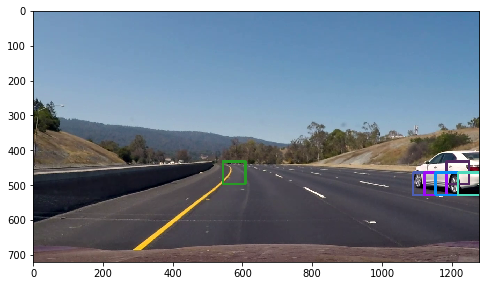

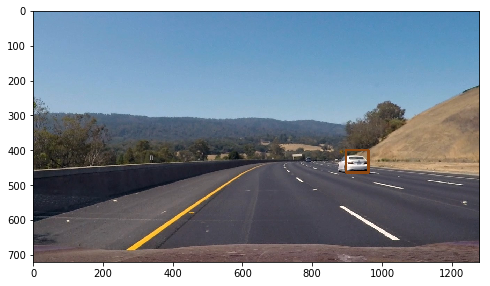

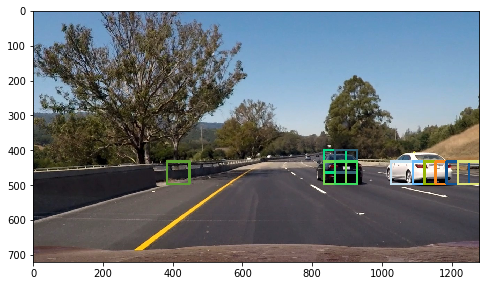

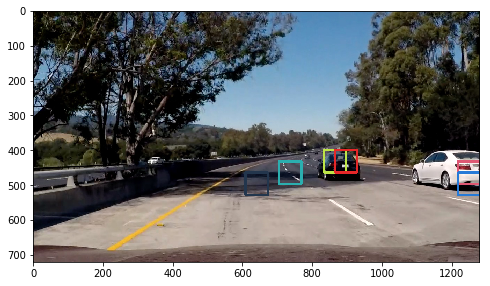

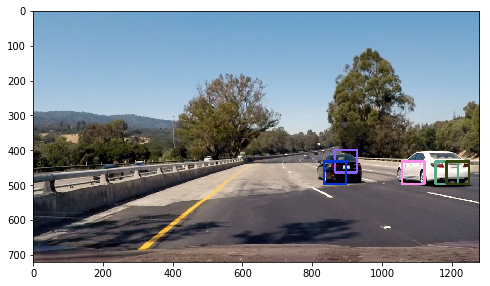

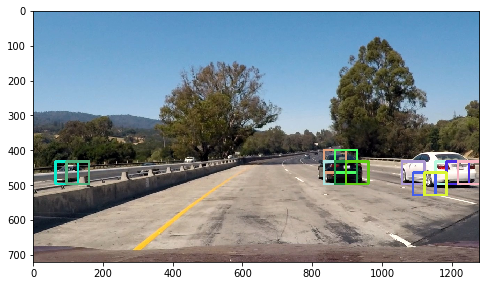

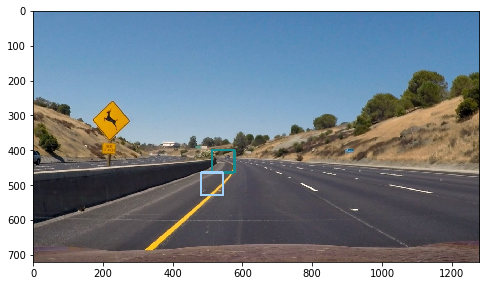

In [11]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, yrange, xrange, scale, model, cspace, orient, pix_per_cell, 
              cell_per_block, bin_size, draw = False):
    draw_img = np.copy(img)
    
    if cspace != None:
        subimg_cvt = cv2.cvtColor(img[yrange[0]:yrange[1],xrange[0]:xrange[1],:], cspace).astype(np.float32)
    else:
        subimg_cvt = img[yrange[0]: yrange[1], xrange[0]: xrange[1], :].astype(np.float32)
        
    if scale != 1:
        imshape = subimg_cvt.shape
        img_inp = cv2.resize(subimg_cvt, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    else:
        img_inp = subimg_cvt

    ch1, ch2, ch3 = img_inp[:, :, 0:1], img_inp[:, :, 1:2], img_inp[:, :, 2:3]
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_stepx = 1  # Instead of overlap, define how many cells to step
    cells_per_stepy = 1  # Instead of overlap, define how many cells to step

    nxsteps = (nxblocks - nblocks_per_window) // cells_per_stepx + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_stepy + 1
    
    if not draw:
        # Compute individual channel HOG features for the entire image
        hog1 = extract_hog_features(ch1, orient = orient,
                                        pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                        feature_vec=False)[0][0]
        hog2 = extract_hog_features(ch2, orient = orient,
                                        pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                        feature_vec=False)[0][0]
        hog3 = extract_hog_features(ch3, orient = orient,
                                        pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                        feature_vec=False)[0][0]
    
    rects = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_stepy
            xpos = xb*cells_per_stepx
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            xbox_left = np.int(xleft*scale)
            ytop_draw = np.int(ytop*scale)
            win_draw = np.int(window*scale)
            if not draw:
                # Extract HOG for this patch
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
                
                window_img = cv2.resize(
                    subimg_cvt[ytop_draw:ytop_draw + win_draw, xbox_left:xbox_left+win_draw, :], (window, window))

                color_features = extract_color_features(window_img, size = bin_size).ravel()
                hist_features = extract_hist_features(window_img).ravel()
                
                features = np.hstack((color_features, hist_features, hog_features))
                test_prediction = model.predict([features])

            if draw or test_prediction[0] == 1:
                rects.append(((xbox_left + xrange[0], ytop_draw+yrange[0]),
                              (xbox_left+win_draw+xrange[0],ytop_draw+win_draw+yrange[0])))
    draw_boxes(draw_img, rects)
    return draw_img, rects
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def find_by_slide_window(img, yrange, xrange, scale, model, cspace, orient, pix_per_cell, 
              cell_per_block, bin_size, xy_overlap = (0.5, 0.5), draw = False):
    windows = slide_window(img, xrange, yrange, (64 * scale,) * 2, xy_overlap)
    if cspace != None:
        cvt_img = cv2.cvtColor(img, cspace)
    else:
        cvt_img = img
        
    res = []
    for window in windows:
        (xleft, ytop), (xright, ybot) = map(int, window[0]), map(int, window[1])
        subimg = cv2.resize(cvt_img[ytop: ybot, xleft: xright, :], (64, 64))
        hog_features = extract_hog_features(subimg, None, orient, pix_per_cell, cell_per_block)[0]
        color_features = extract_color_features(subimg, size = bin_size).ravel()
        hist_features = extract_hist_features(subimg).ravel()
        features = np.hstack((color_features, hist_features, hog_features))
        prediction = model.predict([features])
        if draw or prediction[0] == 1:
            res.append(((xleft, ytop), (xright, ybot)))
    draw_img = np.copy(img)
    draw_boxes(draw_img, res)
    return draw_img, res

    

scale = 1
yrange = (400, 400 + round(scale * 64 * 2))
orient = 15
pix_per_cell = 16
cell_per_block = 2
cspace = cv2.COLOR_BGR2YCrCb
bin_size = (16,) * 2

model = deserialize_model('YCrCb', orient, pix_per_cell, cell_per_block)

images = glob.glob('test_images/*')

for fname in images:
    img = cv2.imread(fname)
    out_img, rects = find_by_slide_window(img, yrange, (0, img.shape[1]), scale, model, cspace, orient, 
                               pix_per_cell, cell_per_block, bin_size)


    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    draw_boxes(rgb, rects, color = None)
    f = plt.figure(figsize = (8, 8))
    plt.imshow(rgb)

# Different scale in windows to optimize for depth of field

In [73]:
def get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size,
                          model, scale = None, ystart = None, cropx = None, draw = False):
    yrange = (ystart, ystart + round(scale * 64 * 1.5))
    xrange = (int(img.shape[1] * cropx[0]), int(img.shape[1] * cropx[1]))
#     rects = find_cars(img, yrange, xrange, scale, model, cspace, orient, 
#                       pix_per_cell, cell_per_block, bin_size, draw = draw)[1]
    
    rects = find_by_slide_window(img, yrange, xrange, scale, model, cspace, orient, 
                  pix_per_cell, cell_per_block, bin_size, xy_overlap = (0.75, 0.5), draw = draw)[1]
    if draw:
        out_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        draw_boxes(out_img, rects, color = None)
        f = plt.figure(figsize = (8, 8))
        plt.imshow(out_img)
        f.gca().set_title('Scale {}, Y: {} - {}'.format(scale, yrange[0], yrange[1]))
    return rects

def search_with_windows(img, orient, pix_per_cell, cell_per_block, cspace, model, bin_size, draw = False):
    res = []
    
    # small
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 0.75, ystart = 395, cropx = (0.2, 0.8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 0.75, ystart = 400, cropx = (0.2, 0.8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 0.8, ystart = 400, cropx = (0.2, 0.8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 380, cropx = (0.2, 0.8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 400, cropx = (0.2, 0.8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 410, cropx = (0.2, 0.8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 430, cropx = (0.2, .8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 450, cropx = (0.2, .8), draw = draw)
    res.append(rects)

    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 470, cropx = (0.2, 0.8), draw = draw)    
    res.append(rects)
        
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 490, cropx = (0.2, .8), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 510, cropx = (0.2, .8), draw = draw)
    res.append(rects)
    
#     medium
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 2, ystart = 390, cropx = (0, 1), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 390, cropx = (0, 0.2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 390, cropx = (0.8, 1), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 400, cropx = (0, 0.2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 400, cropx = (0.8, 1), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 410, cropx = (0, 0.2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 410, cropx = (0.8, 1), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 430, cropx = (0, 0.2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 430, cropx = (0.8, 1), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 450, cropx = (0, 0.2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 450, cropx = (0.8, 1), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 470, cropx = (0, 0.2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1, ystart = 470, cropx = (0.8, 1), draw = draw)
    res.append(rects)

    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1.5, ystart = 400, cropx = (0, .2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1.5, ystart = 400, cropx = (0.8, 1), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1.5, ystart = 430, cropx = (0, .2), draw = draw)
    res.append(rects)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 1.5, ystart = 430, cropx = (0.8, 1), draw = draw)
    res.append(rects)
    
    # large, triple weighted to account for less overlap in bigger cars
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 2, ystart = 400, cropx = (0, .3), draw = draw)
    res.append(rects * 3)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 2, ystart = 400, cropx = (0.7, 1), draw = draw)
    res.append(rects * 3)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 2, ystart = 410, cropx = (0, .3), draw = draw)
    res.append(rects * 3)
    
    rects = get_rects_from_window(img, orient, pix_per_cell, cell_per_block, cspace, bin_size, model,
                               scale = 2, ystart = 410, cropx = (0.7, 1), draw = draw)
    res.append(rects * 3)
        
    return res

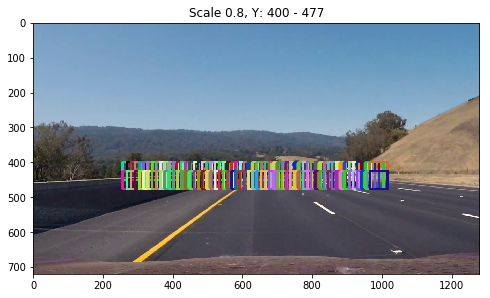

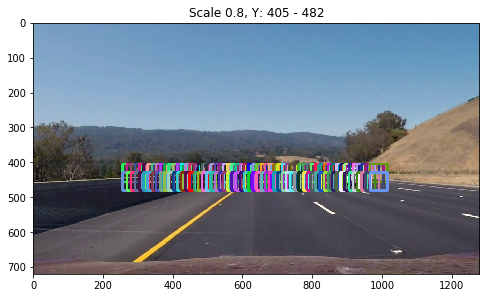

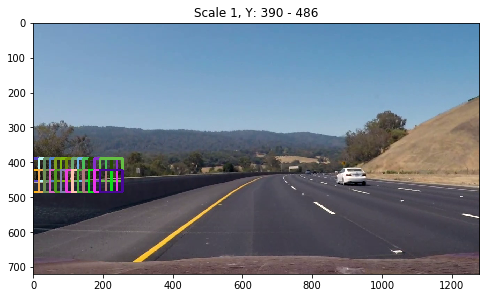

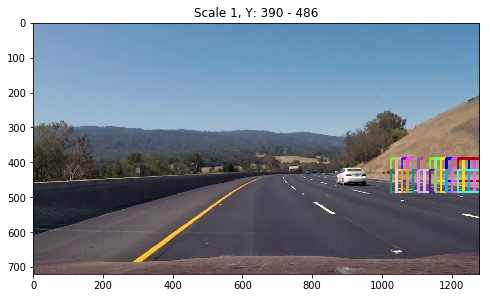

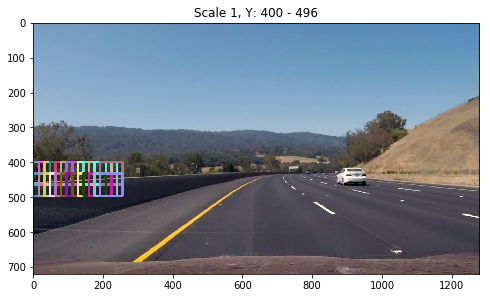

...

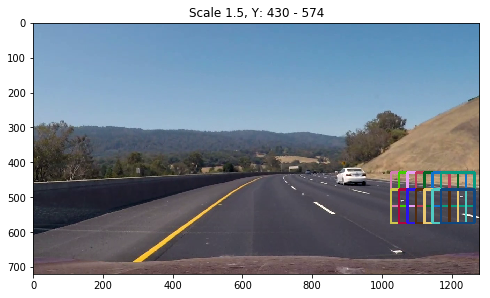

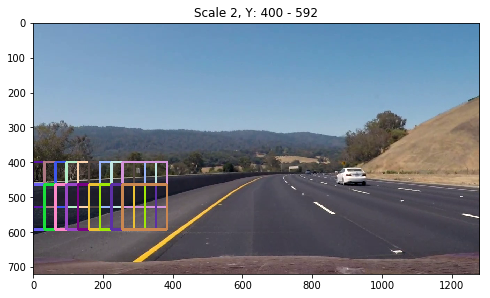

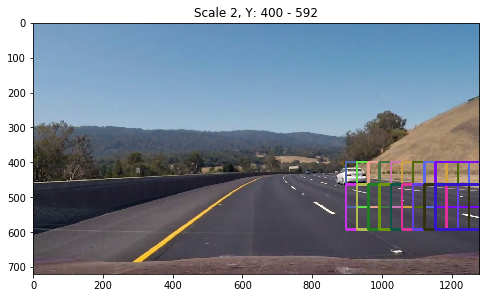

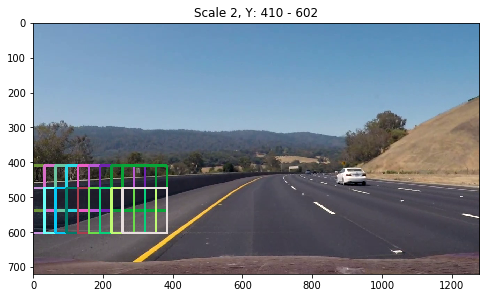

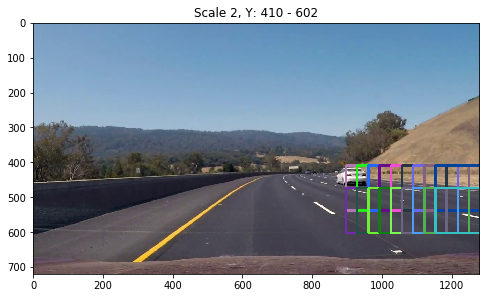

In [63]:
orient = 11
pix_per_cell = 16
cell_per_block = 2
bin_size = (32, ) * 2
cspace = None
img = cv2.imread('test_images/snap2.png')
model = deserialize_model('LUV', orient, pix_per_cell, cell_per_block)

boxes = search_with_windows(img, orient, pix_per_cell, cell_per_block, cspace, model, bin_size, draw = True)

# Make predictions with multiple window scales

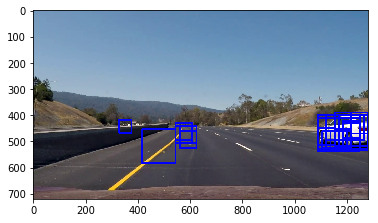

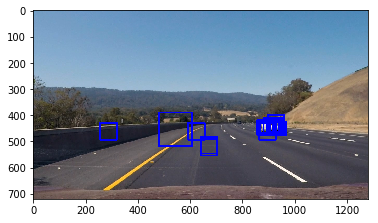

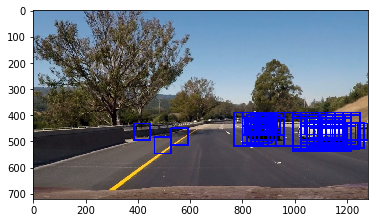

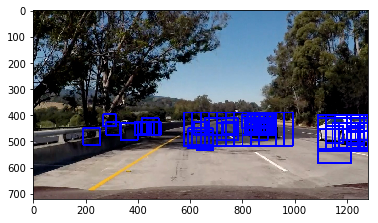

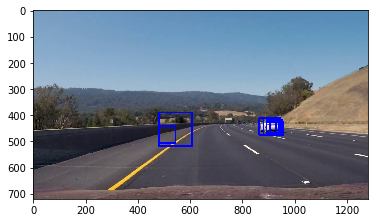

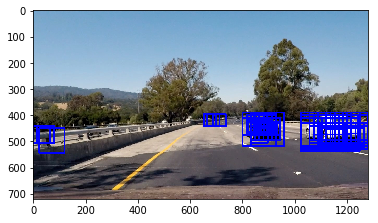

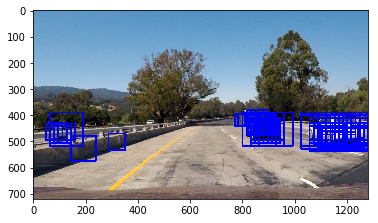

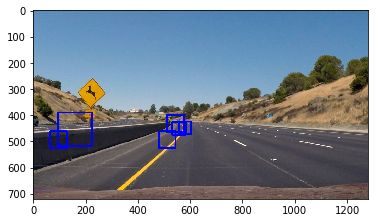

In [82]:
images = glob.glob('test_images/*')

orient = 15
pix_per_cell = 16
cell_per_block = 2
cspace = cv2.COLOR_BGR2YCrCb
bin_size = (16,) * 2
model = deserialize_model('YCrCb', orient, pix_per_cell, cell_per_block)

for fname in images:
    img = cv2.imread(fname)

    windows = search_with_windows(img, orient, pix_per_cell, cell_per_block, cspace, model, bin_size, draw = False)
    boxes = [rect for window in windows for rect in window]

    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    draw_img = np.copy(rgb)
    draw_boxes(draw_img, boxes)
    f = plt.figure()
    plt.imshow(draw_img)
    f.savefig('output_images/{}'.format(fname.split('/')[-1]))

# Heat map functions to detect false positives

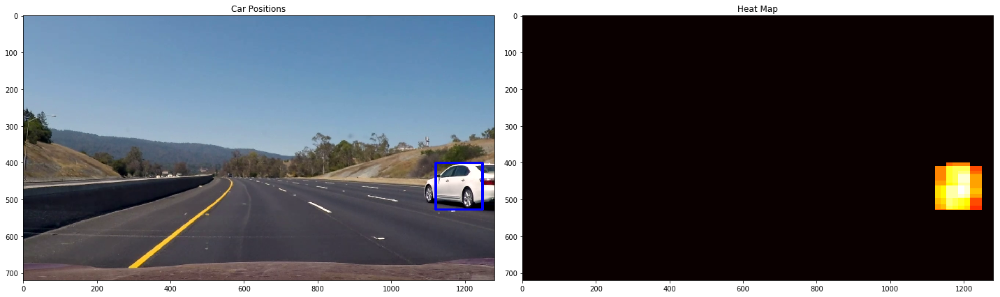

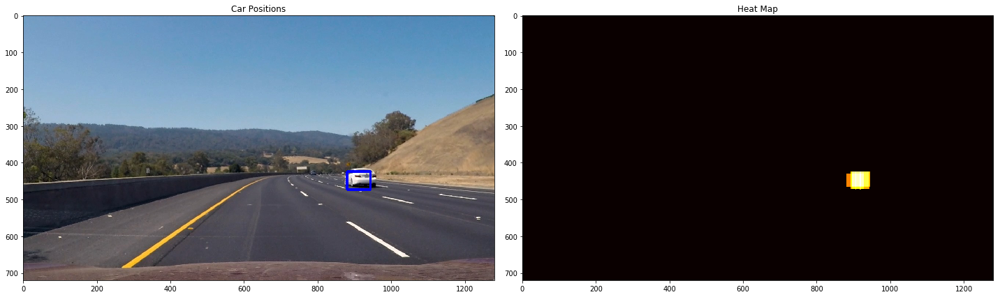

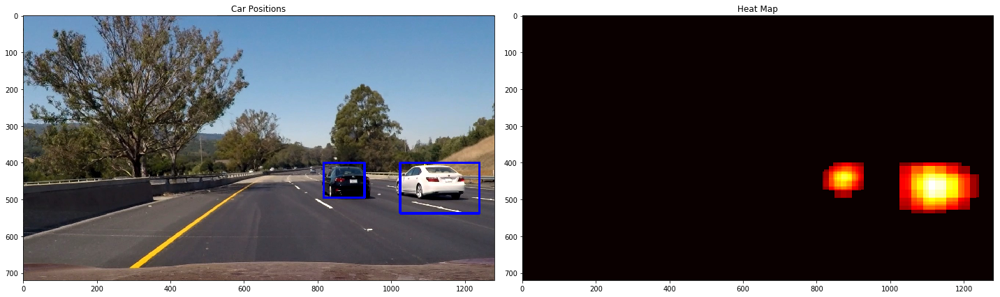

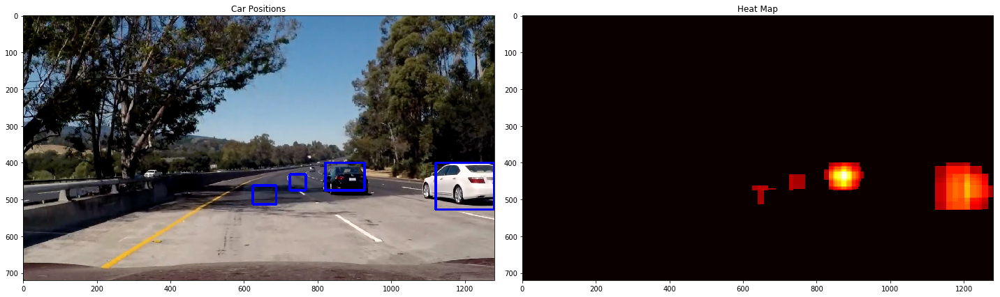

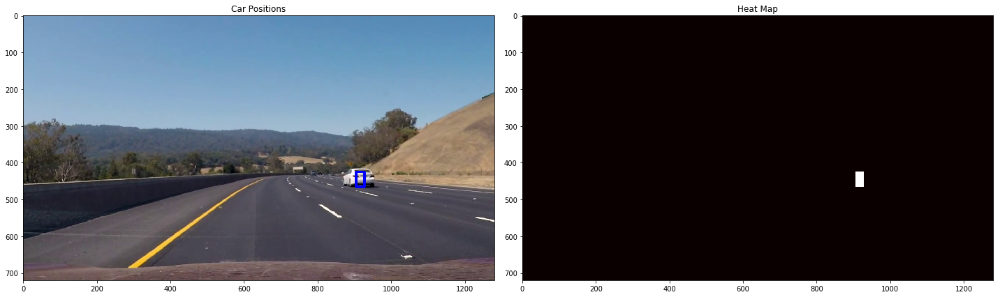

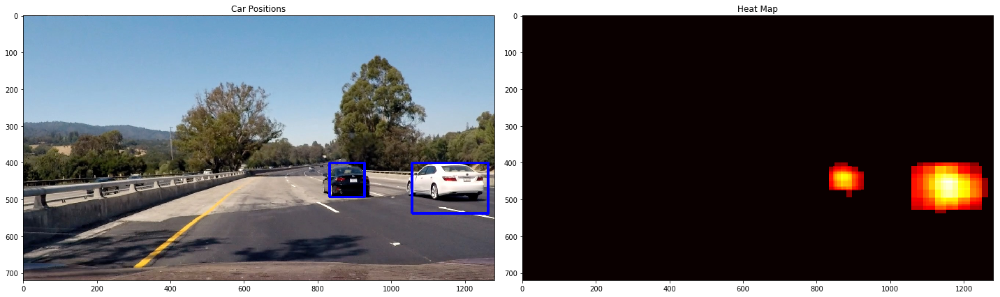

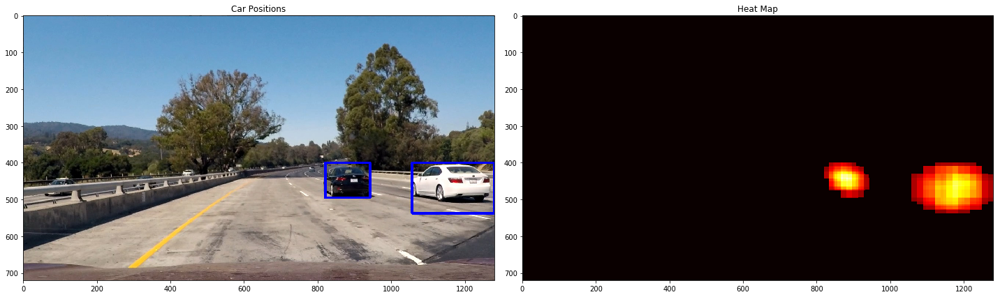

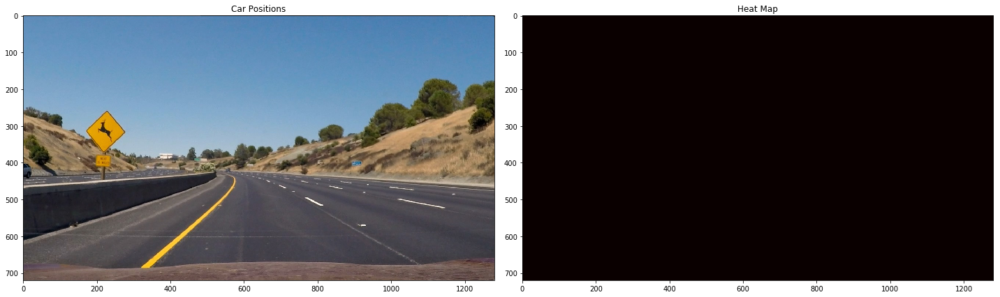

In [75]:
from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

orient = 15
pix_per_cell = 16
cell_per_block = 2
cspace = cv2.COLOR_BGR2YCrCb
bin_size = (16,) * 2
model = deserialize_model('YCrCb', orient, pix_per_cell, cell_per_block)
images = glob.glob('test_images/*')

for fname in images:
    img = cv2.imread(fname)
    windows = search_with_windows(img, orient, pix_per_cell, cell_per_block, cspace, model, bin_size)
    boxes = [rect for window in windows for rect in window]
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    heat = np.zeros_like(img[:, :, 0])

    # Add heat to each box in box list
    heat = add_heat(heat, boxes)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, 8)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = np.copy(rgb)
    draw_img = draw_labeled_bboxes(draw_img, labels)

    fig = plt.figure(figsize = (20, 10))
    plt.subplot(121)
    plt.imshow(draw_img)
    plt.title('Car Positions')
    plt.subplot(122)
    plt.imshow(heatmap, cmap='hot')
    plt.title('Heat Map')
    fig.tight_layout()

# Pipeline to process video frame


In [89]:
orient = 15
pix_per_cell = 16
cell_per_block = 2
cspace = cv2.COLOR_RGB2YCrCb
bin_size = (16, ) * 2

class DetectPipeline:
    def __init__(self, model, orient, pix_per_cell, cell_per_block, cspace, bin_size, n_frames = 10):
        self.model = model
        self.orient = orient
        self.pix_per_cell = pix_per_cell
        self.cell_per_block = cell_per_block
        self.cspace = cspace
        self.bin_size = bin_size
        self.n_frames = n_frames
        self.frames = []
        self.cnt = 0
        self.n_frame_per_sample = 1
        self.frame_hits = 0
        self.prev_labels = []
        self.prev_boxes = []

    def detect(self, img):
        if self.frame_hits % self.n_frame_per_sample != 0:
            self.frame_hits += 1
        else:
            windows = search_with_windows(img, 
                                          self.orient, self.pix_per_cell, self.cell_per_block, self.cspace, 
                                          self.model, self.bin_size)
            boxes = [rect for window in windows for rect in window]

            # Remember frame
            self.frames.append(boxes)

            # Remove frame when we have over self.n_frames
            if len(self.frames) > self.n_frames:
                self.frames = self.frames[1:]
            self.frame_hits = 1

            heat = np.zeros_like(img[:,:,0]).astype(np.float32)

            # Add heat to each box in box list
            for frame in self.frames:
                heat = add_heat(heat, frame)

            # Apply threshold to help remove false positives
            heatmap = apply_threshold(np.copy(heat), len(self.frames) * 7)
            # Find final boxes from heatmap using label function
            labels = label(heatmap)

            self.prev_labels = labels
            self.prev_boxes = boxes
        
        draw_img = draw_labeled_bboxes(np.copy(img), self.prev_labels)

        draw_overlay = np.copy(img)
        draw_boxes(draw_overlay, self.prev_boxes)
        draw_overlay = cv2.resize(draw_overlay, None, fx = 0.3, fy = 0.3)
        
        overlays = [draw_overlay]
        
        for idx, overlay in enumerate(overlays):
            xleft = draw_img.shape[1] - overlay.shape[1] * (idx + 1)
            xright = draw_img.shape[1] - overlay.shape[1] * idx
            draw_img[0: overlay.shape[0], xleft: xright] = overlay
        
        self.cnt += 1        
        if self.cnt == 10:
            f = plt.figure(figsize = (20, 10))
            plt.imshow(draw_img)
            f.savefig('output_images/labelbbox')
            
            z_heat = np.zeros_like(img[:, :, 0].astype(np.float))
            frame_heats = [add_heat(np.copy(z_heat), frame) for frame in self.frames]
            f = plt.figure(figsize = (20, 10))
            grid = (2, 5)
            coors = np.vstack(np.mgrid[:grid[0], :grid[1]].T)
            for idx, frame_heat in enumerate(frame_heats):
                axis = plt.subplot2grid(grid, coors[idx])
                axis.imshow(frame_heat, cmap = 'hot')
                
            f.savefig('output_images/frameheat')
            f = plt.figure(figsize = (20, 10))
            plt.imshow(heat, cmap = 'hot')
            f.savefig('output_images/heatmap')
            
            
        return draw_img
    
    def reset():
        self.frames = []
    
model = deserialize_model('YCrCb', orient, pix_per_cell, cell_per_block)
n_frames = 10

# for t in range(1, 6):
#     pipeline = DetectPipeline(model, orient, pix_per_cell, cell_per_block, cspace, bin_size, n_frames)
#     img = cv2.imread('test_images/test{}.jpg'.format(t))[:, :, ::-1]
#     f = plt.figure(figsize = (8, 8))
#     plt.imshow(pipeline.detect(img))

# Process Video

[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4



 97%|█████████▋| 38/39 [04:23<00:06,  6.24s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 5min 27s, sys: 2.52 s, total: 5min 30s
Wall time: 4min 25s


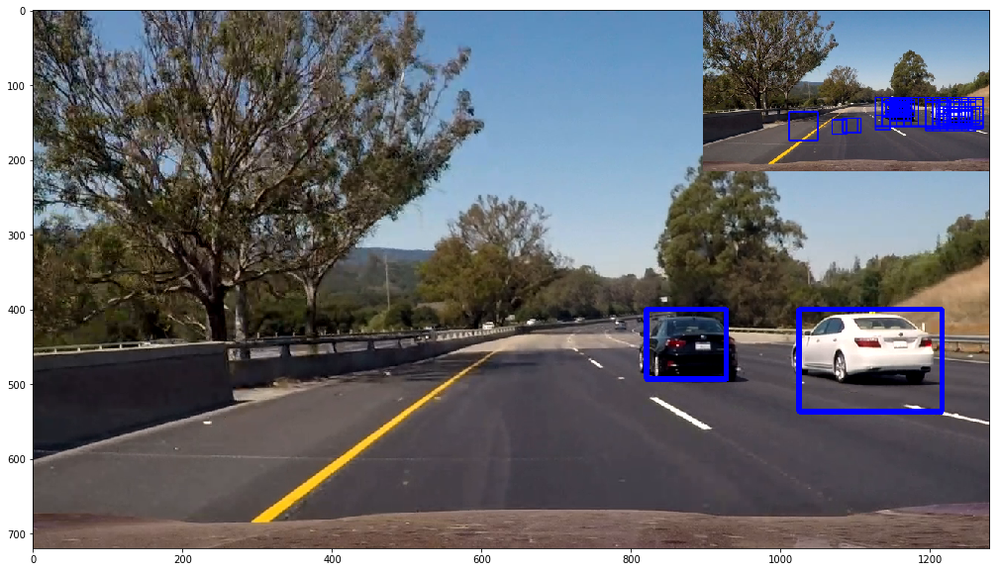

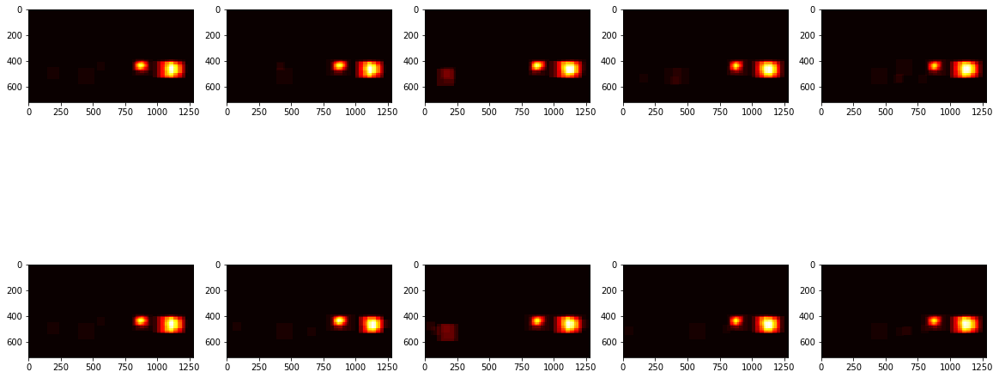

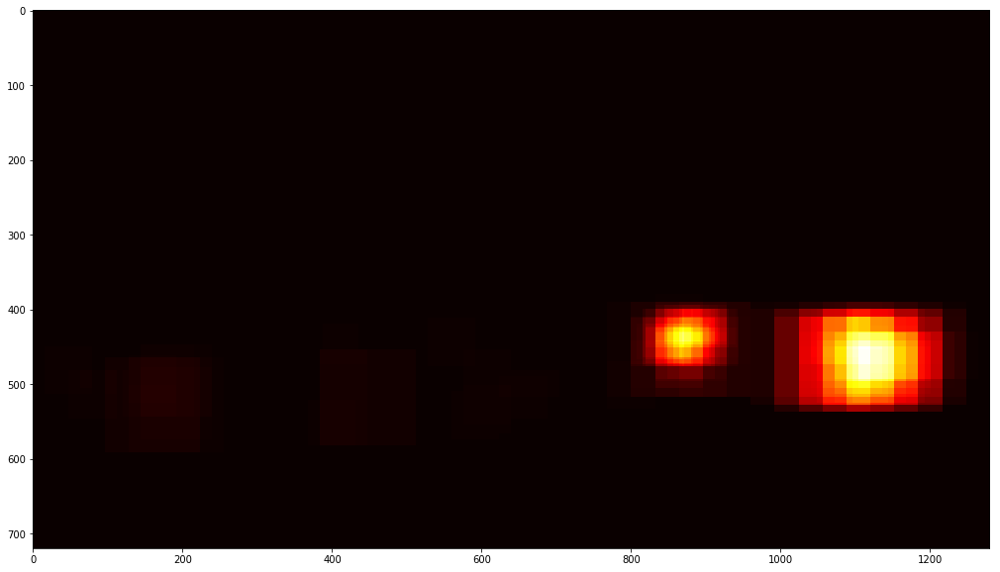

In [91]:
orient = 15
pix_per_cell = 16
cell_per_block = 2
cspace = cv2.COLOR_RGB2YCrCb
bin_size = (16, ) * 2
model = deserialize_model('YCrCb', orient, pix_per_cell, cell_per_block)
n_frames = 10

pipeline = DetectPipeline(model, orient, pix_per_cell, cell_per_block, cspace, bin_size, n_frames)

out = 'test_video_out.mp4'
clip = VideoFileClip('test_video.mp4')
clip_out = clip.fl_image(pipeline.detect)
%time clip_out.write_videofile(out, audio=False)

In [93]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(out))

In [76]:
orient = 15
pix_per_cell = 16
cell_per_block = 2
cspace = cv2.COLOR_RGB2YCrCb
bin_size = (16 ,) * 2
model = deserialize_model('YCrCb', orient, pix_per_cell, cell_per_block)
n_frames = 10

pipeline = DetectPipeline(model, orient, pix_per_cell, cell_per_block, cspace, bin_size, n_frames)

out = 'project_video_out.mp4'
clip = VideoFileClip('project_video.mp4')
clip_out = clip.fl_image(pipeline.detect)
%time clip_out.write_videofile(out, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [22:59<00:01,  1.10s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 28min 42s, sys: 3.9 s, total: 28min 46s
Wall time: 23min 1s


In [77]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(out))